## Natural Language Processing (NLP) Tutorial

In [1]:
# Useful in beautifying numpy arrays.
from IPython.display import HTML, display
import tabulate
def pp(a, show_head=True): 
    '''
    args: show_head -> if True print only first 5 rows.
    return: None
    '''
    if a.ndim < 2:
        a = [a]
    if show_head:
        display(HTML(tabulate.tabulate(a[:5], tablefmt='html')))
        return
    display(HTML(tabulate.tabulate(a, tablefmt='html')))

In [2]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from collections import defaultdict

Here, we'll deal with free text (Natural Language) which is widely available data. 

NLP looks to understand the structure behind free text, e.g. perform tasks like parse the sentences grammatically, describe the general entities and properties that the text is referring to etc. 


Most basic tasks involving free text can be carried out using relatively simple methods that we can easily understand without any reference to complex machine learning: methods like bag-of-word models, TFIDF vectors, and (simple n-gram) language models. It's likely that Deep Learning methods in future might render these methods obsolete but we are quite not there yet. 


A truly intelligent agent is not really intelligent if it cannot understand natural language; Yet, unfortunately, we're not there yet. State-of-the

You can easily come up with examples which 

All of the ML algorithms we have seen so far deal with numerical values. Natural language on the other hand 

### Terminology


`A Note on NLP Terminology`
- “Words” or “Terms” refer to individual tokens separated by whitespace, and additionally also refers to puncutation.

- "Document” refer to an individual group of free text data i.e. document consists of words.

- "Corpus" is a collection of documents.

- "Vocabulary" is number of unique words across all documents (i.e. in corpus).

## Feature Extraction

We'll transform textual features into numerical features usable for machine learning algorithms.


In [3]:
documents = [
    "machine learning is such an amazing field",
    "i enjoy writing machine learning programs",
    "i think of tests as learning instruments"
]

#### Bag of Words (BOW)

As the name suggests, BOW is simply a set of words that make up the document irrespective of their relative positioins. 

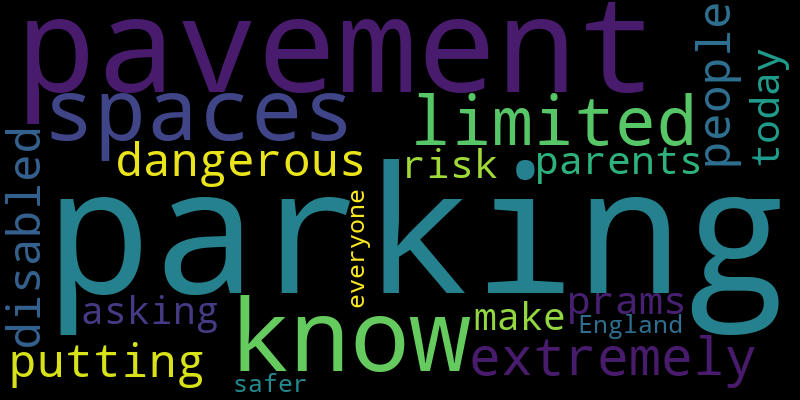

In [4]:
tweet = "I know parking spaces can be limited, but pavement \
        parking can be extremely dangerous, putting disabled \
        people and parents with prams at risk. So today we're \
        asking how we can make England's pavements safer for everyone."
from wordcloud import WordCloud
wc = WordCloud(width=800,height=400).generate( tweet)
wc.to_image()

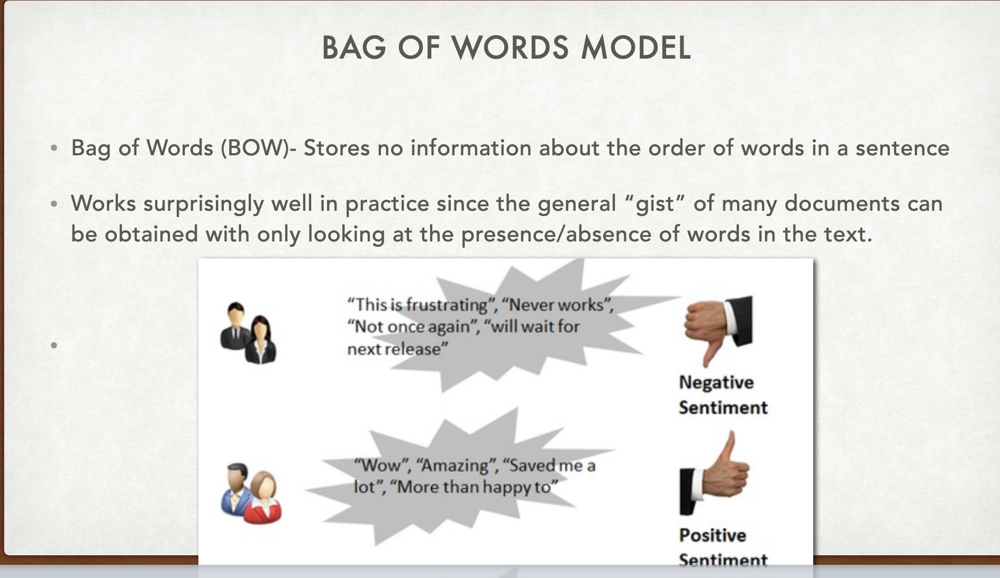

Despite the obvious information we are throwing away with this representation, it send to work surpringingly well in practice. The general “gist” of many documents can be obtained with only looking at the presence/absence of words in the text.
- We'll tokenize text (giving an integer id for each possible token using space/comma as seprater)
- We'll count the occurrences of tokens (words) in each document- `TF` (explained below)
- We'll normalize and weight with diminishing importance tokens that occur in the majority of samples / documents-`TFIDF` (explained below)

This specific strategy (tokenization, counting and normalization) is called the Bag of Words.

More in [sklearn docs](https://scikit-learn.org/stable/modules/feature_extraction.html#text-feature-extraction).

### TF-IDF
`A Matrix`

Before discussing TFIDF let's talk about TF and IDF, TFIDF is simply their product
### TF (Term Frequency)
We can represent the documents using a term frequency matrix, and $m \times n$ matrix where m denotes the number of documents, and n denotes the vocabulary size. Specifically, the entry in row i and column j represents the number of times the word j occcurs in document i. Where 'word j' is jth word in 'Vocabulary'.

In [5]:
documents

['machine learning is such an amazing field',
 'i enjoy writing machine learning programs',
 'i think of tests as learning instruments']

Split each document into tokens

In [6]:
document_words = [doc.split() for doc in documents]

Get all unique words in all documents (i.e. entire corpus)

In [7]:
vocab = sorted(set(sum(document_words, [])))
print(vocab, "\n") # list containing unique words in corpus.

['amazing', 'an', 'as', 'enjoy', 'field', 'i', 'instruments', 'is', 'learning', 'machine', 'of', 'programs', 'such', 'tests', 'think', 'writing'] 



Assign each word a unique index.

In [8]:
vocab_dict = {k:i for i,k in enumerate(vocab)} # word-index mapping. Used next in TF matrix.
print(vocab_dict, "\n") 

{'amazing': 0, 'an': 1, 'as': 2, 'enjoy': 3, 'field': 4, 'i': 5, 'instruments': 6, 'is': 7, 'learning': 8, 'machine': 9, 'of': 10, 'programs': 11, 'such': 12, 'tests': 13, 'think': 14, 'writing': 15} 



Create the TF matrix. 

In [9]:
TF = np.zeros((len(documents), len(vocab)), dtype=int)
for i, doc in enumerate(document_words):
    for word in doc:
        TF[i, vocab_dict[word]] += 1
print('shape of TF matrix', TF.shape)


shape of TF matrix (3, 16)


The number of rows is equal to total documents (3 here). And the number of columns is equal to vocabulary size. In the first document, there is a word 'machine'. How does it reflect in our TF matrix? For the first documment, consider the first row in TF matrix. In our word-index mapping, we assigned '13' for the word 'machine'.
```Python 
print(vocab_dict['machine']) # prints 13
```
So, in the first row, at index 13, there is a '1'. Similarly, the word 'also' (index assigned: 1) doesn't exist in document 1, so there is zero in first row at index 1. (The word-index mapping is arbitrary but once defined we shouldn't modify it for consistency).

There are 3 documents and 27 unique words in vocabulary. Therefore, TF matrix has 3 rows and 27 columns. 

#### TF in sklearn
Let's compute TF using [count vectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html#sklearn-feature-extraction-text-countvectorizer) of sklearn. 

In [10]:
vectorizer = CountVectorizer()

TF_sklearn = vectorizer.fit_transform(documents,)
print(TF_sklearn.shape) # (3,25) but it should be (3,27).
pp(TF_sklearn.toarray())

(3, 15)


1,1,0,0,1,0,1,1,1,0,0,1,0,0,0
0,0,0,1,0,0,0,1,1,0,1,0,0,0,1
0,0,1,0,0,1,0,1,0,1,0,0,1,1,0


Are they the same TF matrices. It appears sklearn skipped two terms. 

In [11]:
TF_sklearn.shape == TF.shape

False

In [12]:
print((vectorizer.get_feature_names()))

['amazing', 'an', 'as', 'enjoy', 'field', 'instruments', 'is', 'learning', 'machine', 'of', 'programs', 'such', 'tests', 'think', 'writing']


### Exercise 

Write code to find out which two terms are missing in sklearn TF yet present in our implementation.

### Answer
It turns out sklearn by default will only include words with at least 2 chars. We can change this default behavior by overwriting an argument to constructor `token_pattern` which accepts [regex](https://en.wikipedia.org/wiki/Regular_expression). 

##### Aside (regex): 
Regular expressions are really powerful, read the [regex documentation for Python](https://docs.python.org/3/howto/regex.html) to explore the power of regex. Using a sequence of characters in regex we can write a search pattern which makes solving complicated search problems very easy to solve. For example, in a text if we want to remove all punctuations [e.g. #%#%&%^] and extract only alphabets and digits, we will write a simple regex: `\w+` (see below for an example in Python)
```Python 
import re # import regular expressions library for Python
regex_for_alphanumeric_extraction = re.compile('\w+') # This is our search pattern 
# Find all words in a text that match the search patters (i.e. only alphabets (abc..) and digits (123..) are extracted)
raw_text = 'regex can @$#@#$ remove)))) ***all^^^ non alphanumeric chars. 5 is a digit%#%'
print(regex_for_alphanumeric_extraction.findall(raw_text)) # prints: ['regex','can', 'remove', 'all', 'non', 'alphanumeric', 'chars', '5', 'is', 'a','digit']
```
It's certainly possible to solve this problem without regex but a lot more difficult.

In [13]:
# Pass this token pattern (regex) to make sklearn behavior similar to ours.
vectorizer_inclcudes_single_char = CountVectorizer(token_pattern=u"(?u)\\b\\w+\\b")
TF_sklearn_inclcudes_single_char  = vectorizer_inclcudes_single_char.fit_transform(documents,)
print(TF_sklearn_inclcudes_single_char.shape)
pp(TF_sklearn_inclcudes_single_char.toarray())

(3, 16)


1,1,0,0,1,0,0,1,1,1,0,0,1,0,0,0
0,0,0,1,0,1,0,0,1,1,0,1,0,0,0,1
0,0,1,0,0,1,1,0,1,0,1,0,0,1,1,0


Now, the shape (3,27) match with the one in our implementation.

In [14]:
TF_sklearn_inclcudes_single_char.shape == TF.shape

True

#### Drawback of TF
The issue with TF representation of documents is that common words (such as is, a, to) that occur frequently in most documents will dominate the corresponding vector of a document. These common words are not conveying much information about that document. Consider the task of finding how similar two documents are: similarity score will be influenced highly by these common words e.g. two highly unsimilar documents with a lot of 'a's' and 'to's' will be rendered similar. We somehow want to diminish these common words entries in a document vector.

### IDF (Inverse Document Frequency)
`A Vector`

The above drawback can be resolved via the inverse document frequency weight for words in vocabulary. IDF for word $j$ commonly is defined as: $$ IDF_j = \log \frac{\# documents}{\# documents \ with \ word_j}$$

Sklearn's definition of IDF is a little [different](https://scikit-learn.org/stable/modules/feature_extraction.html#tfidf-term-weighting).

In [15]:
count_docs_with_word_j = TF.astype(bool).sum(axis=0) 

In [16]:
total_docs = TF.shape[0]
IDF = np.log(total_docs/count_docs_with_word_j)
pp(IDF)

1.09861,1.09861,1.09861,1.09861,1.09861,0.405465,1.09861,1.09861,0,0.405465,1.09861,1.09861,1.09861,1.09861,1.09861,1.09861


### Exercise
Notice a 0 in IDF that means that word occurs in all documents $\log (1) = 0$. Which word is that (Warning: solution provided in the next line)?

In [17]:
idx_arr = np.where(IDF == 0) # (array([12]),)
idx = int(idx_arr[0][0]) # extract int 12 
vocab[idx] # 'learning' which indeed occurs in all three docs (verify).

'learning'

### TFIDF (Term Frequency Inverse Document Frequency)
`A matrix`

TFIDF scales the columns of the term frequency matrix by their inverse document frequency. In doing so, we still have an effective bag of words representation of each document, but words discounted that occur very frequently, and increasing the weight of less frequent terms. 

In [18]:
TFIDF = TF * IDF
print(TFIDF.shape) # (3,27)
pp(TFIDF)

(3, 16)


1.09861,1.09861,0,0,1.09861,0,0,1.09861,0,0.405465,0,0,1.09861,0,0,0
0,0,0,1.09861,0,0.405465,0,0,0,0.405465,0,1.09861,0,0,0,1.09861
0,0,1.09861,0,0,0.405465,1.09861,0,0,0,1.09861,0,0,1.09861,1.09861,0


#### TFIDF in Sklearn

In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [20]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_sklearn = tfidf_vectorizer.fit_transform(documents)
tfidf_sklearn


<3x15 sparse matrix of type '<class 'numpy.float64'>'
	with 18 stored elements in Compressed Sparse Row format>

`A Couple of Remarks`:
- Notice that by default tfidf is returned as a [sparse matrix](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwiPovy3jKfrAhUTsHEKHZeWDD4QmhMwKHoECAUQAg&url=https%3A%2F%2Fen.wikipedia.org%2Fwiki%2FSparse_matrix&usg=AOvVaw3Aw78Eb9FQfbFwCbSKE3vg) (as was TF_sklearn) which is a very good design decision and works really well in practice. Why? TFIDF mostly will contain 0's as each document will only contain a  fraction of vocabulary (which for real-world data is very large list). 

- Also, notice the shape mismatch again like in TF. Again two words are missing which is expected since under the hood [TfidfVectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn-feature-extraction-text-tfidfvectorizer) is calling [CountVectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html#sklearn-feature-extraction-text-countvectorizer). According to the documentation: tfidf_sklearn is `Equivalent to CountVectorizer followed by TfidfTransformer`.

In [21]:
pp(tfidf_sklearn.toarray()) # readble numpy array

0.410747,0.410747,0,0,0.410747,0,0.410747,0.242594,0.312384,0,0,0.410747,0,0,0
0,0,0,0.504611,0,0,0,0.298032,0.38377,0,0.504611,0,0,0,0.504611
0,0,0.432385,0,0,0.432385,0,0.255374,0,0.432385,0,0,0.432385,0.432385,0


Notice that our tfidf is noticeably different from that of [sklearn implementation](https://scikit-learn.org/stable/modules/feature_extraction.html#tfidf-term-weighting). It appears that sklearn TFIDF returns normalized rows (which actually is the case). There are other differences such as sklearn adds normalizing 1s in defining IDF. See the [docs](https://scikit-learn.org/stable/modules/feature_extraction.html#tfidf-term-weighting) for in depth information on sklearn implementation. We'll end our discussion on TFIDF here.

## Text classification Using TFIDF Features
`Support Vector Classifier`

In [22]:
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')

The dataset is large and it'll take some time to train. To quickly train you can use fewer samples (not recommended for real-world projects- to state the obvious- more training data will decrease generalization error).

In [23]:
n_samples = 1000
# tf_news = vectorizer.fit_transform(newsgroups_train.data)
raw_text = newsgroups_train.data[:n_samples]
tfidf_feats = tfidf_vectorizer.fit_transform(raw_text)
labels = newsgroups_train.target[:n_samples]

In [24]:
from sklearn.svm import SVC
svc_clf = SVC()

In [25]:
tfidf_feats

<1000x32190 sparse matrix of type '<class 'numpy.float64'>'
	with 157775 stored elements in Compressed Sparse Row format>

In [26]:
train_size = int(n_samples * .8) # 80% data for training
x_train = tfidf_feats[:train_size]
y_train = labels[:train_size]
svc_clf.fit(tfidf_feats, labels)

SVC()

In [27]:
x_test = tfidf_feats[train_size:]
y_test = labels[train_size:]

svc_clf.score(x_test, y_test)

0.995

# Stop!
###  Please Go to `'NLP_Tutorial'>'supplementary_notebooks'>'Test'>'test.ipynb'` and solve a real-world problem as an exercise.

`Solution` of the same test is available at `'NLP_Tutorial'>'supplementary_notebooks'>'test_with_solution'>'test_with_solutionn.ipynb'.`

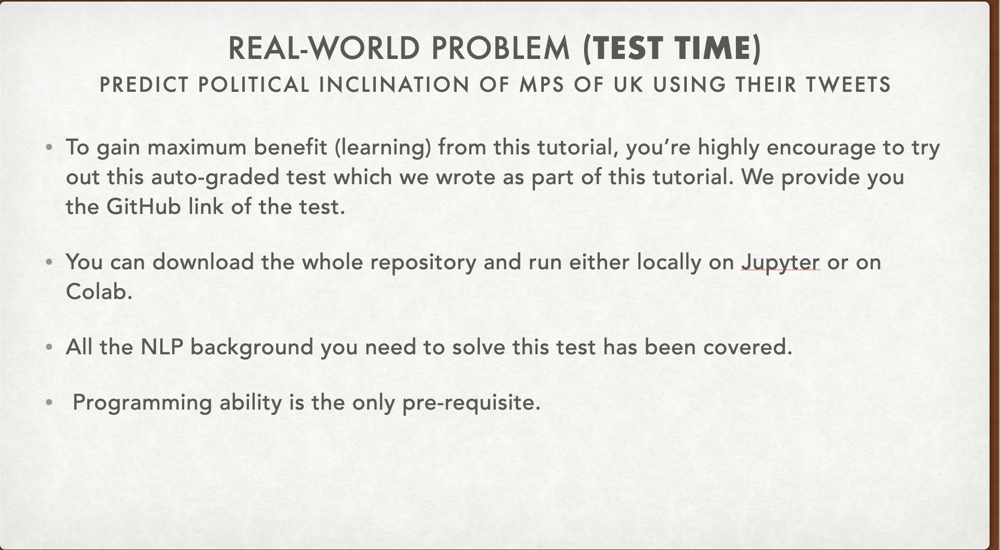

### Deep Learning

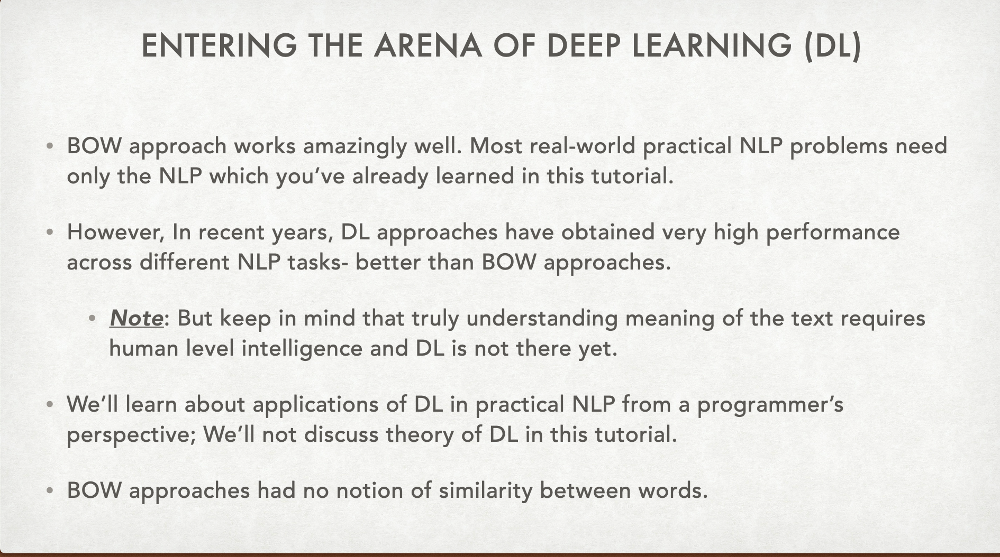

### Downside of BOW and Introduction to Word Embeddings

One of the downsides to term frequency models (even as far as bag-of-words (BOW) representations are concerned), is there is no notion of similarity between words. But in reality, we do associate some notion of similarity between different words. For example, consider the following corpus:


In [28]:
documents = [ 
    "king will reward dwarf",
    "queen is angry",
    "apple is worth more than 2 trillion dollars now"
]

Semantically, we'll agree that the first two documents are similar while the third is different. Bag of words approach will blindly assert that 2nd and 3rd have a matching word `is` while the first two have no matching word. A BOW model will, wrongly, say document 2 and 3 are similar. 

To get started with word embeddings, we’ll note that words in the term frequency model can also be considered as being represented by vectors; in particular, any word is represented by a “one-hot” vector that has a zero in all the coordinates except a one in the coordinate specified by the word. 

In our corpus, word 'king' for example could be represened as 
```Python
[0, 0, 0, 1, 0, 0, ...] # only one 1- all other 0s. Length of this array is equal to the vocabulary size. (Here, arbitrary econding is shown to illustrate the point. In practice, each word in vocabulary is assigned an index (e.g. king -> 3), and while representing that word using one-hot vector, we'll put a '1' at that specific index only).
```


## Word Embedding

Like the one-hot encoding of words, a word embedding is a vector representation of words. Embedding represents each word with a $k$-dimensional vector. Importantly, Euclidean distances in the word embedding (attempt to) correspond to some notion of similarity between the words. $k$ could be much smaller than vocabulary size.

### Creating Embeddings.
Creating word embeddings falls in the arena of Deep Learning.
A common approach that has ignited a lot of recent interest in word embeddings is the [word2vec](https://code.google.com/archive/p/word2vec/) algorithm. Simply put, in word2vec, given a large body of text, an algorithm is trained that can “predict” the context around a word. word2vec was trained on over 300 billion words from Google News, and containing 3 million unique words, with embeddings of size k=300. Training such a model on such a large dataset will require huge computational power. Instead we'll use a smaller version- pretrained word2vec English Wikipedia. Available [here](https://drive.google.com/file/d/1zkckPYnB9VZcmPkT1PUi0wOb0l6qHkia/view?usp=sharing) on gdrive.

### Pretrained word2vec using gensim
We'll use [gensim](https://radimrehurek.com/gensim/) library instead  of sklearn.

In [55]:
import gensim as gs
import numpy as np
word2vec_model = gs.models.KeyedVectors.load_word2vec_format(
                'supplementary_notebooks/data/deps.words.bin', binary=True)

In [33]:
word2vec_model["king"][:5] # a 300 dim vector. Get first 5 entries

array([ 0.03303813,  0.06656987,  0.02628002, -0.05732338,  0.01353508],
      dtype=float32)

In [34]:
word2vec_model["queen"][:5] # a 300 dim vector. Get first 5 entries

array([0.01998595, 0.15262055, 0.00061866, 0.01659017, 0.07441706],
      dtype=float32)

The smaller version of word2vec covers a lot of common words you would use in English.

## Similarity Measures
As we mentioned earlier the notion of similarity in word embeddings, we can get words closest to 'king': 'Queen' is one of them.

In [35]:
word2vec_model.similar_by_word("king", topn=5)

[('norodom', 0.6755779981613159),
 ('songtsän', 0.6748666167259216),
 ('queen', 0.6625942587852478),
 ('bhumibol', 0.6613788604736328),
 ('monarch', 0.6593648195266724)]

### Embedding Matrix
Let's create our own vectorizer that returns embedding vectors given documents.
Here, the idea is to take the mean of the embedding of each word in a document. For example, first document has 4 words, each of dimension 300. We'll take mean of these 4 vectors and get a mean embedding of dimension 300 for this document. For a corpus of 3 documents, we'll get embeddings of shape (3,300). This is one way.

In [47]:
# EmbeddingBag in PyTorch does the same.
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec_model):
        self.word2vec = word2vec_model
        self.dim = 300 # default 300 dim vectors returned by our word2vec 

    def fit(self, X, y):
        return self

    def transform(self, X_list):
        return np.array([
            np.mean([self.word2vec[w] for w in doc if w in self.word2vec]
                    or [np.zeros(self.dim)], axis=0)  # if word not in word2vec return a vector of zeros
            for doc in X_list
        ])

## Text classification Using Embeddings 
Let's try text classification though we shouldn't expect to see very good results as our miniature word2vec was trained only on a few thousand words. Most of the words in our corpus have no embeddings; thus, assigned a zero vector- losing a lot of information. Also, our feature vector is of size 300, in TFIDF the size was ~32000.  

To increase accuracy, try using word2vec trained on much larger dataset. Alternatively, use ['Glove' embeddings](https://nlp.stanford.edu/projects/glove/).

# Stop!
###  Please Go to `'NLP_Tutorial'>'supplementary_notebooks'>'small_word2vec_embeddings_for_tweets_classification.ipynb'` and read that notebook before proceeding.


### Transition to  DL
We used TFIDF features and pre-trained embeddings as features. Evidently, the performance of Machine Learning algorithm depends crucially on coming up with good features. 
`Can we come up with an algorithm that will automatically learn the features themselves?`. Yes, the answer is Neural Networks.

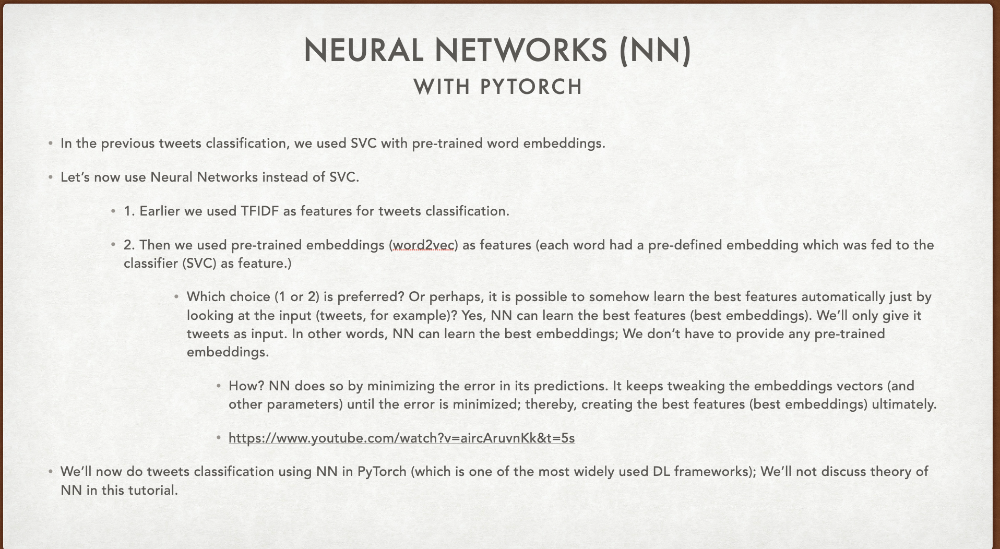

###  Now, Please Go to `'NLP_Tutorial'>'supplementary_notebooks'>'NLP_with_PyTorch.ipynb'` and read the  remainder of this tutorial there.